In [ ]:
import torch
from torch import nn
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

def show_tensor_images(image_tensor_real, image_tensor_fake, num_images=25, size=(1, 28, 28)):
    image_unflat = image_tensor_real.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    real_img = image_grid.permute(1, 2, 0).squeeze()

    image_unflat = image_tensor_fake.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)

    fake_img = image_grid.permute(1, 2, 0).squeeze()

    f = plt.figure()
    f.add_subplot(1,2, 1)
    plt.imshow(real_img)
    f.add_subplot(1,2, 2)
    plt.imshow(fake_img)
    plt.show(block=True)

# Generator Description

In [ ]:
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples, z_dim, device = device) 


def get_generator_block(input_dim, output_dim):
    block = nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True))
    return block


class Generator(nn.Module):
    def __init__(self, z_dim=10, im_dim = 784, hidden_dim=128):
        super().__init__()
        self.generator = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim*2),
            get_generator_block(hidden_dim*2, hidden_dim*4),
            get_generator_block(hidden_dim*4, hidden_dim*8),
            nn.Linear(hidden_dim*8, im_dim),
            nn.Sigmoid())
        
    def forward(self, noise):
        return self.generator(noise)

# Discriminator:


In [ ]:
def get_discriminator_block(input_dim, output_dim):
    block = nn.Sequential(
        nn.Linear(input_dim, output_dim),
         nn.LeakyReLU(negative_slope=0.2))
    return block


class Discriminator(nn.Module):
    def __init__(self, im_dim = 784, hidden_dim=128):
        super().__init__()
        self.discriminator = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim*4),
            get_discriminator_block(hidden_dim*4, hidden_dim*2),
            get_discriminator_block(hidden_dim*2, hidden_dim),
            nn.Linear(hidden_dim, 1))

    def forward(self, image):
        return self.discriminator(image)            

## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.

In [ ]:
from torchvision.datasets import MNIST
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader

# Hyperparameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 1e-5

#Loading MNIST dataset as tensors
dataloader = DataLoader(MNIST('.', download = True, transform = transforms.ToTensor()), 
                        batch_size=batch_size,
                        shuffle=True)
device = 'cuda'

In [ ]:
gen = Generator(z_dim).to(device)
gen_optimizer = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_optimizer = torch.optim.Adam(disc.parameters(), lr=lr)

## Loss Functions

In [ ]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    noise = get_noise(num_images, z_dim, device=device)
    fake_images = gen(noise)  # generating fake images
    y_pred_fake = disc(fake_images.detach()) # class prediction on fake images 
    y_true_fake = torch.zeros_like(y_pred_fake) # true labels for fake images
    fake_loss = criterion(y_pred_fake, y_true_fake) # calculating descriminator loss from fake images

    y_pred_real = disc(real) # class prediction on real images
    y_true_real = torch.ones_like(y_pred_real) # class label of real images
    real_loss = criterion(y_pred_real,  y_true_real) # calculating discriminator loss from real images
    return (fake_loss + real_loss)/2


def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    noise = get_noise(num_images, z_dim, device=device)
    fake_images = gen(noise)
    y_pred_fake = disc(fake_images)
    y_true_fake = torch.ones_like(y_pred_fake) # generator wants discriminator to think that these are real 
    return criterion(y_pred_fake, y_true_fake)

# Running the Training: 

Epoch: 1, step: 500, Gen Loss: 2.981837856769564, Disc Loss: 0.20607236944139


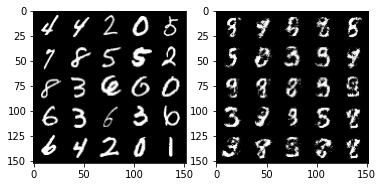

Epoch: 2, step: 1000, Gen Loss: 2.955879842281342, Disc Loss: 0.2043880482167007


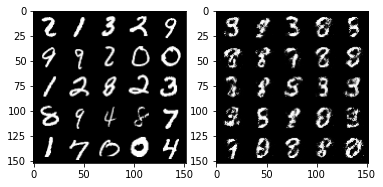

Epoch: 3, step: 1500, Gen Loss: 3.032675209999087, Disc Loss: 0.19350325334072135


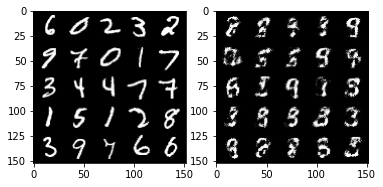

Epoch: 4, step: 2000, Gen Loss: 3.000463898658751, Disc Loss: 0.19102845264971247


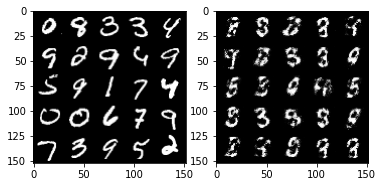

Epoch: 5, step: 2500, Gen Loss: 2.980316447258, Disc Loss: 0.20930990672111527


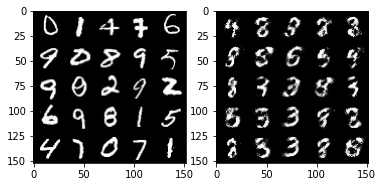

Epoch: 6, step: 3000, Gen Loss: 2.8661192064285292, Disc Loss: 0.20908348722755896


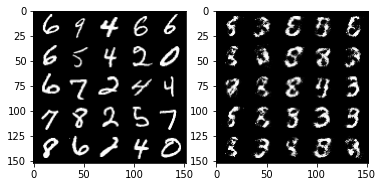

Epoch: 7, step: 3500, Gen Loss: 2.7441617584228526, Disc Loss: 0.2175329095125198


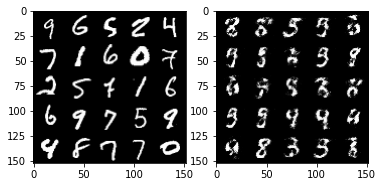

Epoch: 8, step: 4000, Gen Loss: 2.8139987406730653, Disc Loss: 0.22734425312280654


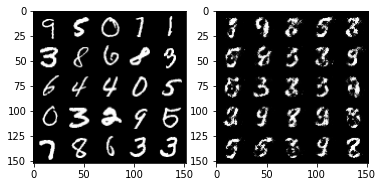

Epoch: 9, step: 4500, Gen Loss: 2.749822151184081, Disc Loss: 0.22847232347726812


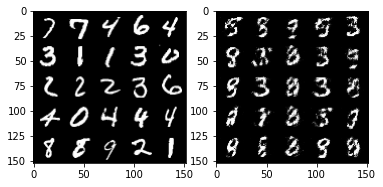

Epoch: 10, step: 5000, Gen Loss: 2.6333617663383504, Disc Loss: 0.2405934720635414


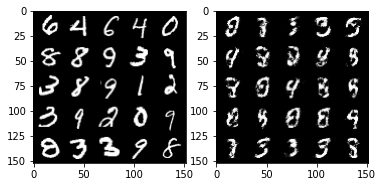

Epoch: 11, step: 5500, Gen Loss: 2.763013261318207, Disc Loss: 0.2196369452029466


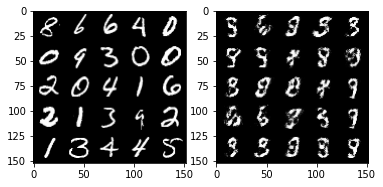

Epoch: 12, step: 6000, Gen Loss: 2.664576237201689, Disc Loss: 0.22840249648690217


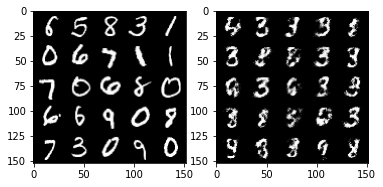

Epoch: 13, step: 6500, Gen Loss: 2.6522403845787066, Disc Loss: 0.22434557902812943


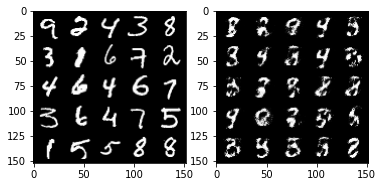

Epoch: 14, step: 7000, Gen Loss: 2.6949662771224974, Disc Loss: 0.22737900057435032


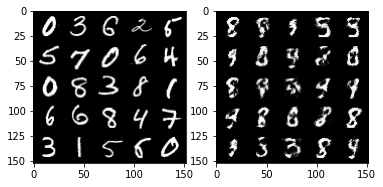

Epoch: 15, step: 7500, Gen Loss: 2.484009166240695, Disc Loss: 0.2672880162894726


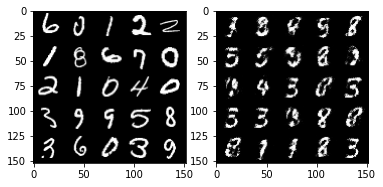

Epoch: 17, step: 8000, Gen Loss: 2.4486900064945227, Disc Loss: 0.26044773179292713


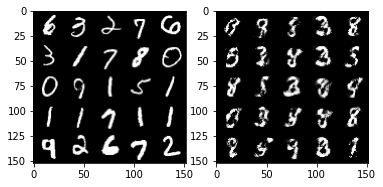

Epoch: 18, step: 8500, Gen Loss: 2.503084198236465, Disc Loss: 0.26322439256310454


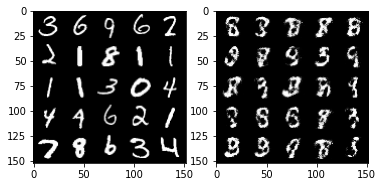

Epoch: 19, step: 9000, Gen Loss: 2.419037395954131, Disc Loss: 0.25981476813554755


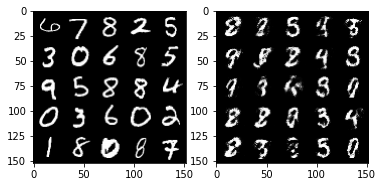

Epoch: 20, step: 9500, Gen Loss: 2.4624712698459614, Disc Loss: 0.2503725613653657


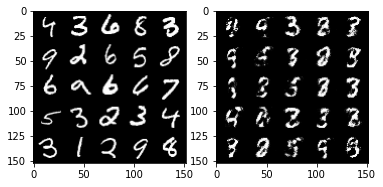

Epoch: 21, step: 10000, Gen Loss: 2.482869308710097, Disc Loss: 0.2423686872124674


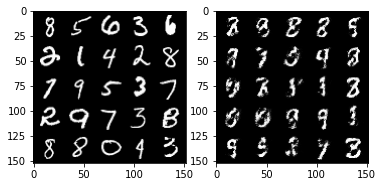

Epoch: 22, step: 10500, Gen Loss: 2.456592813730241, Disc Loss: 0.2542714799046517


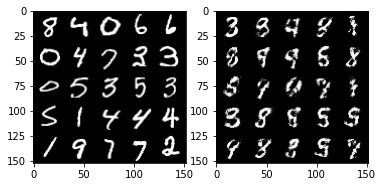

Epoch: 23, step: 11000, Gen Loss: 2.518666962623596, Disc Loss: 0.24808223772048962


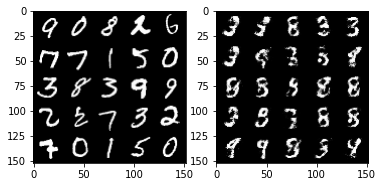

Epoch: 24, step: 11500, Gen Loss: 2.4437304224967944, Disc Loss: 0.2681795884370803


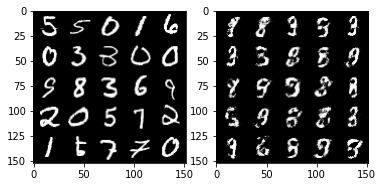

Epoch: 25, step: 12000, Gen Loss: 2.4430653953552235, Disc Loss: 0.2675645328760148


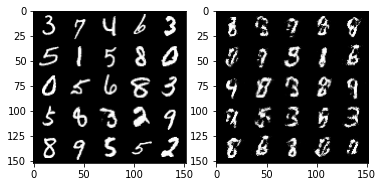

Epoch: 26, step: 12500, Gen Loss: 2.3981198403835298, Disc Loss: 0.2731927017569541


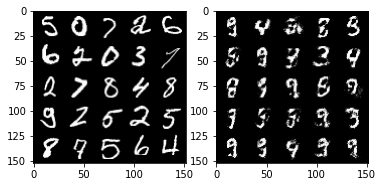

Epoch: 27, step: 13000, Gen Loss: 2.424542774677276, Disc Loss: 0.2558086063861851


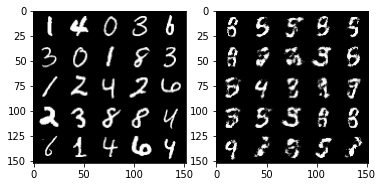

Epoch: 28, step: 13500, Gen Loss: 2.493431454181672, Disc Loss: 0.25628943651914593


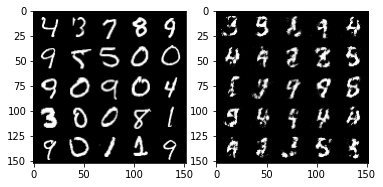

Epoch: 29, step: 14000, Gen Loss: 2.494311709642408, Disc Loss: 0.2542587850987914


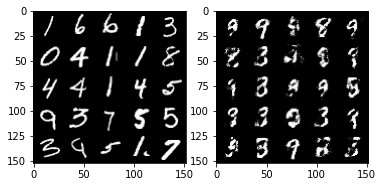

Epoch: 30, step: 14500, Gen Loss: 2.451684471130371, Disc Loss: 0.256179255694151


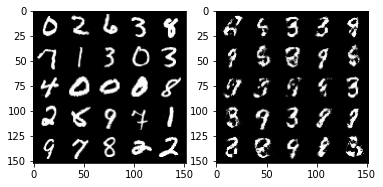

Epoch: 31, step: 15000, Gen Loss: 2.3849713227748848, Disc Loss: 0.2881941631138324


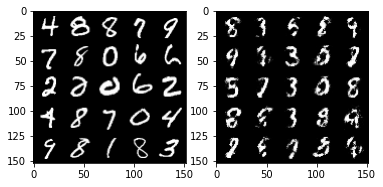

Epoch: 33, step: 15500, Gen Loss: 2.254954021453858, Disc Loss: 0.29828550323843966


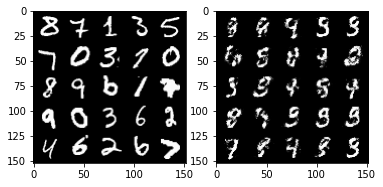

Epoch: 34, step: 16000, Gen Loss: 2.296898962259295, Disc Loss: 0.2906256182193756


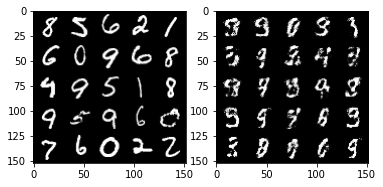

Epoch: 35, step: 16500, Gen Loss: 2.290890184879304, Disc Loss: 0.28323632639646534


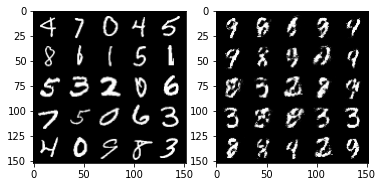

Epoch: 36, step: 17000, Gen Loss: 2.2130168068408955, Disc Loss: 0.318317326426506


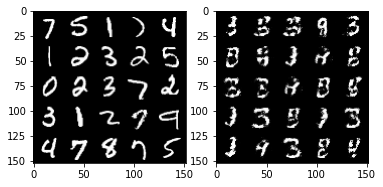

Epoch: 37, step: 17500, Gen Loss: 2.2767342050075525, Disc Loss: 0.30003437280654927


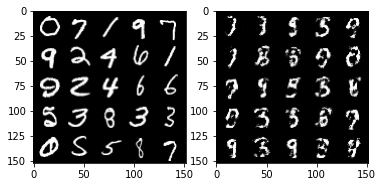

Epoch: 38, step: 18000, Gen Loss: 2.2790315852165226, Disc Loss: 0.2970676365494727


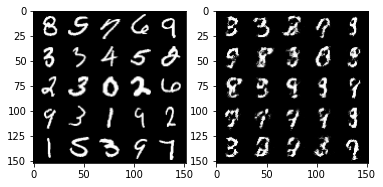

Epoch: 39, step: 18500, Gen Loss: 2.2647812447547904, Disc Loss: 0.2972446842193603


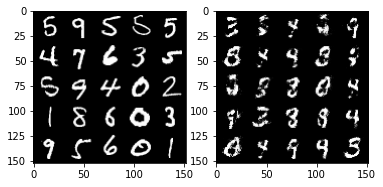

Epoch: 40, step: 19000, Gen Loss: 2.1918451018333434, Disc Loss: 0.30721088364720334


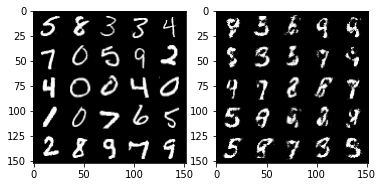

Epoch: 41, step: 19500, Gen Loss: 2.0624305515289314, Disc Loss: 0.3229979995191094


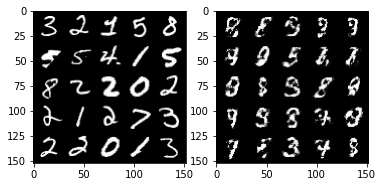

Epoch: 42, step: 20000, Gen Loss: 2.110764324903489, Disc Loss: 0.3049124327003953


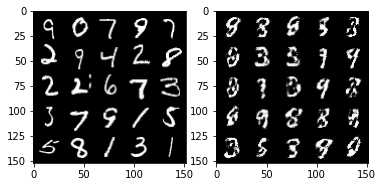

Epoch: 43, step: 20500, Gen Loss: 2.134933088779451, Disc Loss: 0.3070841893553734


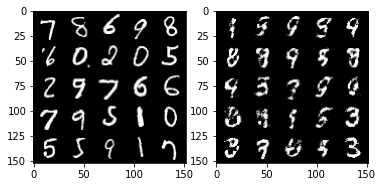

Epoch: 44, step: 21000, Gen Loss: 2.122884927511216, Disc Loss: 0.30823988649249096


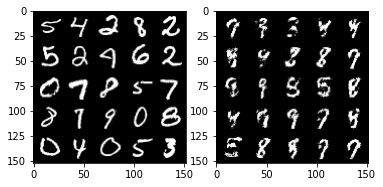

Epoch: 45, step: 21500, Gen Loss: 2.0488300452232364, Disc Loss: 0.33506223931908596


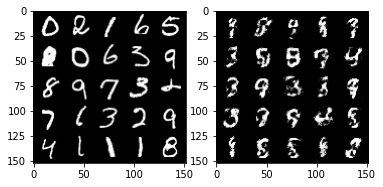

Epoch: 46, step: 22000, Gen Loss: 1.994997831821441, Disc Loss: 0.3439320626258849


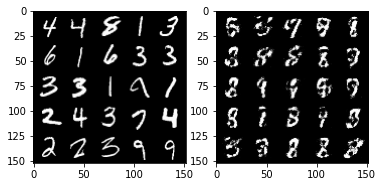

Epoch: 47, step: 22500, Gen Loss: 1.9629788975715639, Disc Loss: 0.3555277738571167


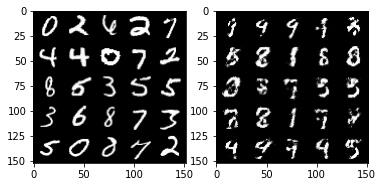

Epoch: 49, step: 23000, Gen Loss: 1.9152940981388091, Disc Loss: 0.35758928924798955


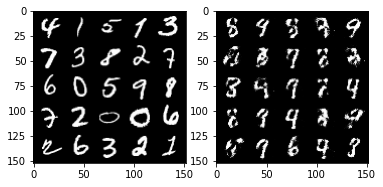

Epoch: 50, step: 23500, Gen Loss: 1.986409096240998, Disc Loss: 0.3458022524416447


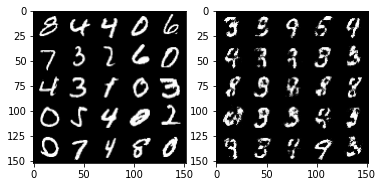

Epoch: 51, step: 24000, Gen Loss: 1.920327462673188, Disc Loss: 0.3487565744519234


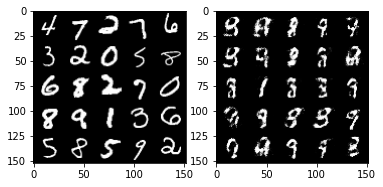

Epoch: 52, step: 24500, Gen Loss: 1.9915433175563821, Disc Loss: 0.3238034116625781


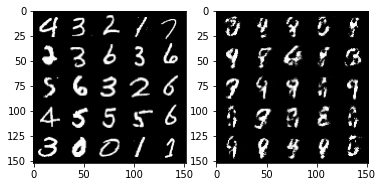

Epoch: 53, step: 25000, Gen Loss: 2.0909839446544627, Disc Loss: 0.3106590324342251


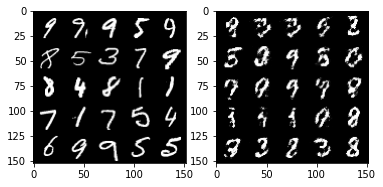

Epoch: 54, step: 25500, Gen Loss: 1.9853019545078285, Disc Loss: 0.3572337693274023


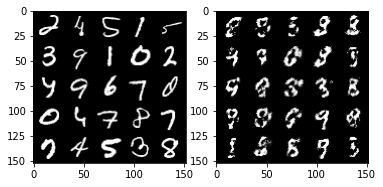

Epoch: 55, step: 26000, Gen Loss: 1.912496727705001, Disc Loss: 0.34499136686325055


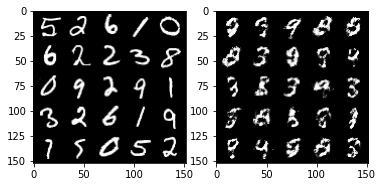

Epoch: 56, step: 26500, Gen Loss: 1.931996162176131, Disc Loss: 0.34617051810026184


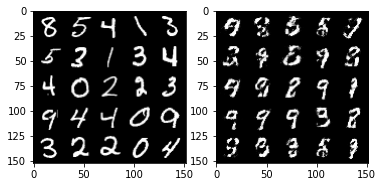

Epoch: 57, step: 27000, Gen Loss: 1.899150796413423, Disc Loss: 0.35201143079996106


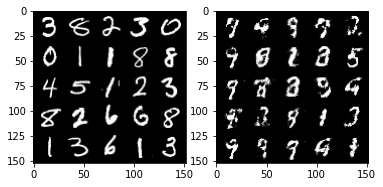

Epoch: 58, step: 27500, Gen Loss: 1.891371184349059, Disc Loss: 0.35260325387120234


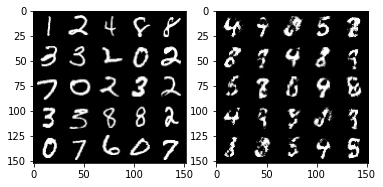

Epoch: 59, step: 28000, Gen Loss: 1.97325559258461, Disc Loss: 0.32328063300251986


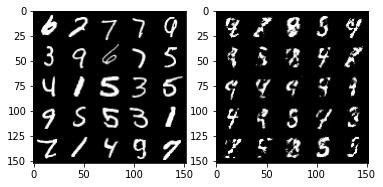

Epoch: 60, step: 28500, Gen Loss: 1.8690328071117406, Disc Loss: 0.363051508069038


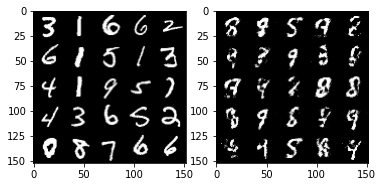

Epoch: 61, step: 29000, Gen Loss: 1.8135125725269303, Disc Loss: 0.367497625261545


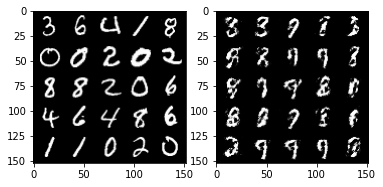

Epoch: 62, step: 29500, Gen Loss: 1.8200365872383104, Disc Loss: 0.36886083102226236


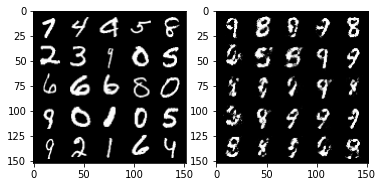

Epoch: 63, step: 30000, Gen Loss: 1.8619999527931217, Disc Loss: 0.35791230016946785


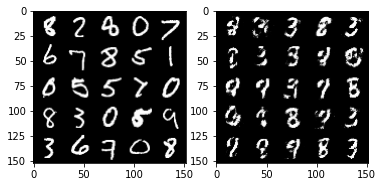

Epoch: 65, step: 30500, Gen Loss: 1.8595397927761075, Disc Loss: 0.362262140214443


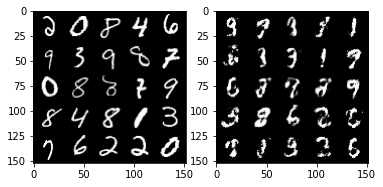

Epoch: 66, step: 31000, Gen Loss: 1.7508379657268534, Disc Loss: 0.3851339762806891


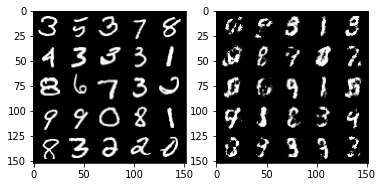

Epoch: 67, step: 31500, Gen Loss: 1.7640390601158151, Disc Loss: 0.3891601608395578


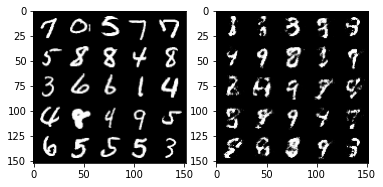

Epoch: 68, step: 32000, Gen Loss: 1.7572646193504318, Disc Loss: 0.3801567726731303


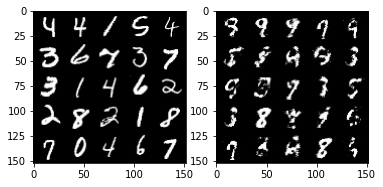

Epoch: 69, step: 32500, Gen Loss: 1.676722286701202, Disc Loss: 0.41554580134153346


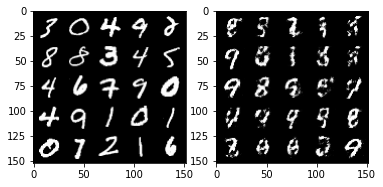

Epoch: 70, step: 33000, Gen Loss: 1.6682257814407349, Disc Loss: 0.40162927305698404


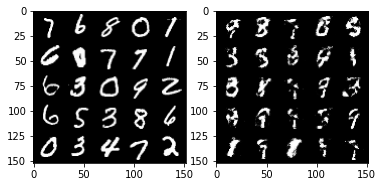

Epoch: 71, step: 33500, Gen Loss: 1.7660264821052543, Disc Loss: 0.3822454673647882


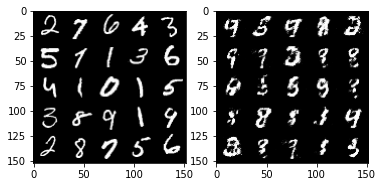

Epoch: 72, step: 34000, Gen Loss: 1.7137859442234036, Disc Loss: 0.4033914347290992


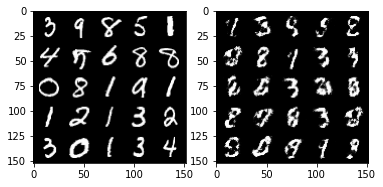

Epoch: 73, step: 34500, Gen Loss: 1.7082804532051077, Disc Loss: 0.3892484768033027


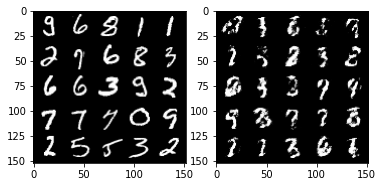

Epoch: 74, step: 35000, Gen Loss: 1.6526536664962768, Disc Loss: 0.3992198564410208


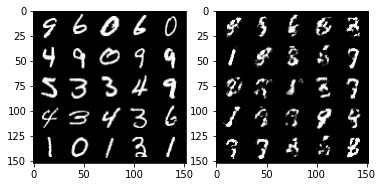

Epoch: 75, step: 35500, Gen Loss: 1.7412273745536822, Disc Loss: 0.3680286698937413


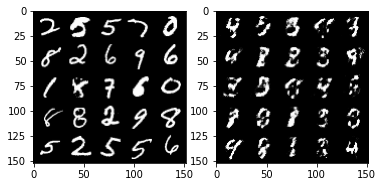

Epoch: 76, step: 36000, Gen Loss: 1.7928081076145188, Disc Loss: 0.3649052820801737


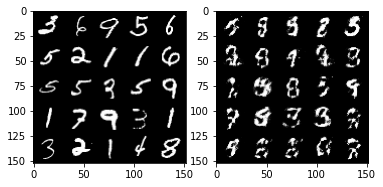

Epoch: 77, step: 36500, Gen Loss: 1.7458316841125487, Disc Loss: 0.37995896089076986


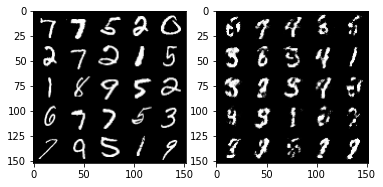

Epoch: 78, step: 37000, Gen Loss: 1.6014064164161674, Disc Loss: 0.42401350951194783


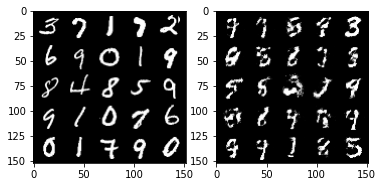

Epoch: 79, step: 37500, Gen Loss: 1.621522418260574, Disc Loss: 0.40464020705223075


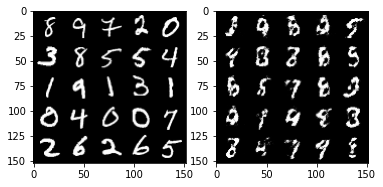

Epoch: 81, step: 38000, Gen Loss: 1.651801879167557, Disc Loss: 0.39529497408866887


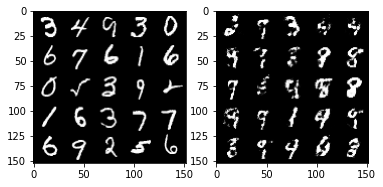

Epoch: 82, step: 38500, Gen Loss: 1.6315041306018834, Disc Loss: 0.3968269776105879


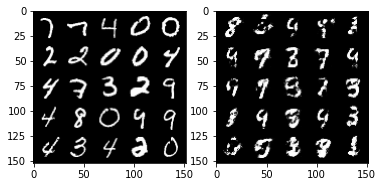

Epoch: 83, step: 39000, Gen Loss: 1.5893764402866386, Disc Loss: 0.4106735117435453


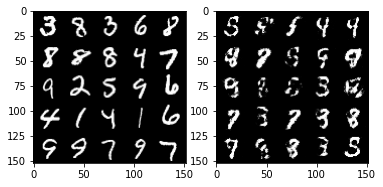

Epoch: 84, step: 39500, Gen Loss: 1.5981582860946646, Disc Loss: 0.41082494431734057


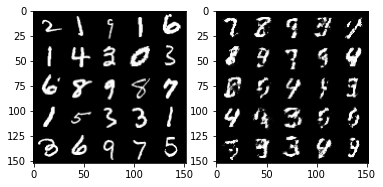

Epoch: 85, step: 40000, Gen Loss: 1.578946649074554, Disc Loss: 0.4220981310606004


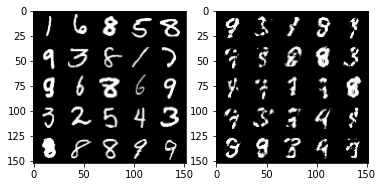

Epoch: 86, step: 40500, Gen Loss: 1.6125276975631706, Disc Loss: 0.40098728561401353


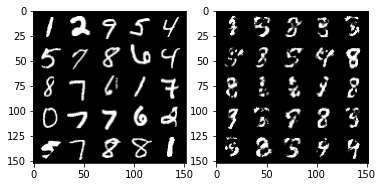

Epoch: 87, step: 41000, Gen Loss: 1.5821904780864708, Disc Loss: 0.41554256862401967


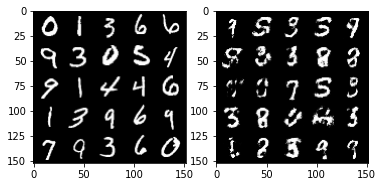

Epoch: 88, step: 41500, Gen Loss: 1.6360500848293316, Disc Loss: 0.3959022743105892


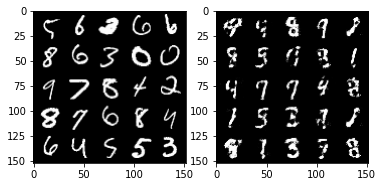

Epoch: 89, step: 42000, Gen Loss: 1.5220856759548185, Disc Loss: 0.4344699585437774


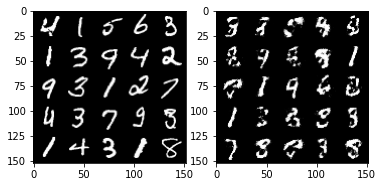

Epoch: 90, step: 42500, Gen Loss: 1.4451995329856888, Disc Loss: 0.45670751124620473


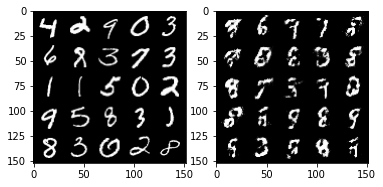

Epoch: 91, step: 43000, Gen Loss: 1.5278578822612776, Disc Loss: 0.4192066017985345


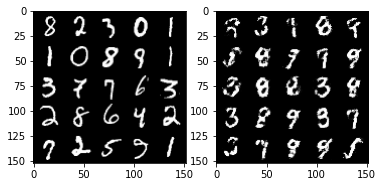

Epoch: 92, step: 43500, Gen Loss: 1.503313829421996, Disc Loss: 0.4444124342799186


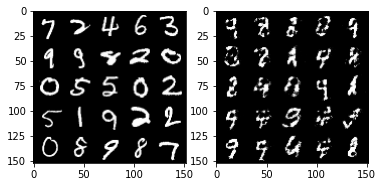

Epoch: 93, step: 44000, Gen Loss: 1.5335753176212314, Disc Loss: 0.4144282916784287


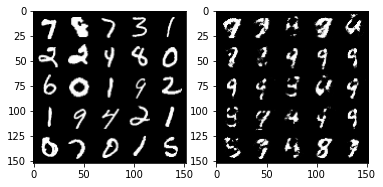

Epoch: 94, step: 44500, Gen Loss: 1.6033399100303654, Disc Loss: 0.3935237696766851


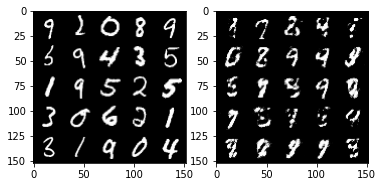

Epoch: 95, step: 45000, Gen Loss: 1.5412017967700942, Disc Loss: 0.4232710195779796


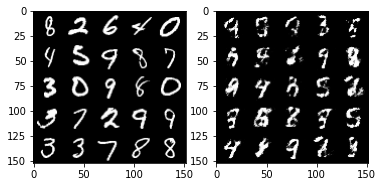

Epoch: 97, step: 45500, Gen Loss: 1.4956251814365398, Disc Loss: 0.4302521149516106


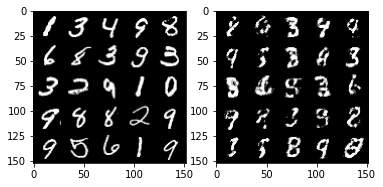

Epoch: 98, step: 46000, Gen Loss: 1.505385645151137, Disc Loss: 0.42260571545362485


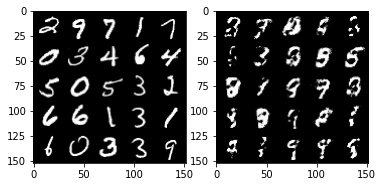

Epoch: 99, step: 46500, Gen Loss: 1.530110739231109, Disc Loss: 0.4220918206572533


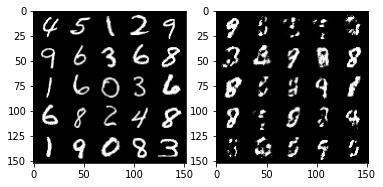

Epoch: 100, step: 47000, Gen Loss: 1.4809273002147672, Disc Loss: 0.4336930586099625


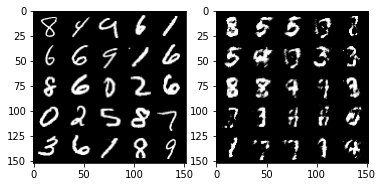

Epoch: 101, step: 47500, Gen Loss: 1.4578576562404642, Disc Loss: 0.4342725465297698


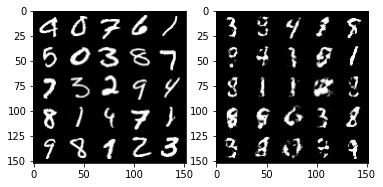

Epoch: 102, step: 48000, Gen Loss: 1.496222428083419, Disc Loss: 0.43041475814580943


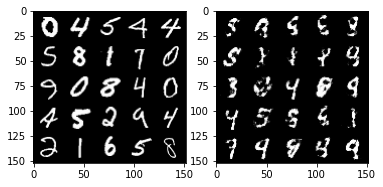

Epoch: 103, step: 48500, Gen Loss: 1.4879593882560727, Disc Loss: 0.4403921292424203


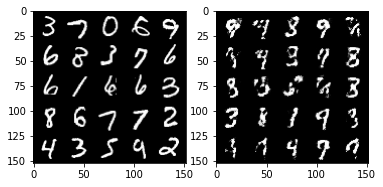

Epoch: 104, step: 49000, Gen Loss: 1.5033728277683258, Disc Loss: 0.426740049064159


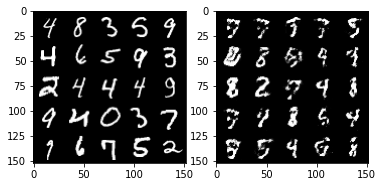

Epoch: 105, step: 49500, Gen Loss: 1.514446009397507, Disc Loss: 0.4304279021620753


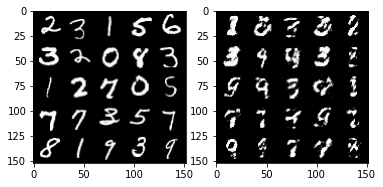

Epoch: 106, step: 50000, Gen Loss: 1.4798693456649765, Disc Loss: 0.43042399042844753


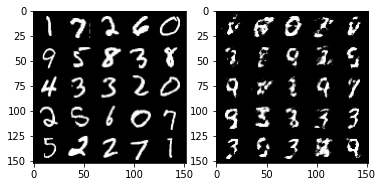

Epoch: 107, step: 50500, Gen Loss: 1.4730113034248364, Disc Loss: 0.44501570850610744


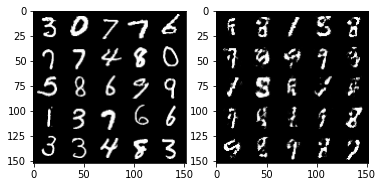

Epoch: 108, step: 51000, Gen Loss: 1.3909250299930564, Disc Loss: 0.47858170759677854


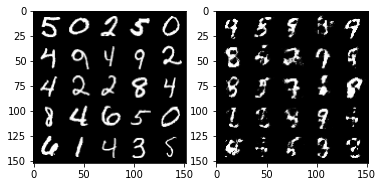

Epoch: 109, step: 51500, Gen Loss: 1.3863860006332402, Disc Loss: 0.4677325003743172


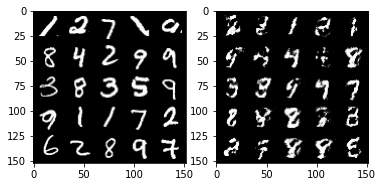

Epoch: 110, step: 52000, Gen Loss: 1.3679080259799954, Disc Loss: 0.4793926032185552


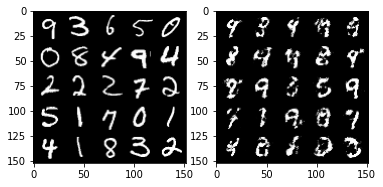

Epoch: 111, step: 52500, Gen Loss: 1.452728309869766, Disc Loss: 0.44669879209995206


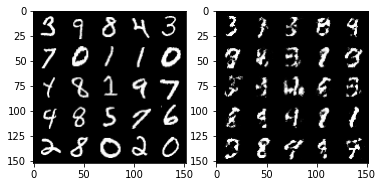

Epoch: 113, step: 53000, Gen Loss: 1.4487911555767061, Disc Loss: 0.446668564617634


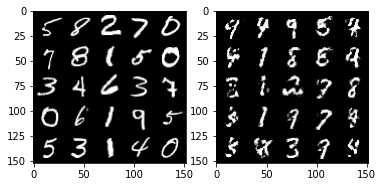

Epoch: 114, step: 53500, Gen Loss: 1.4577102565765387, Disc Loss: 0.44324045932293016


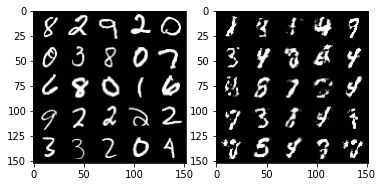

Epoch: 115, step: 54000, Gen Loss: 1.3458199994564037, Disc Loss: 0.47848173081874834


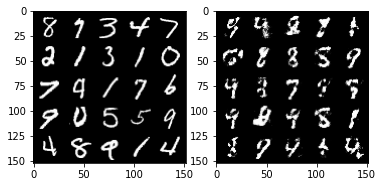

Epoch: 116, step: 54500, Gen Loss: 1.366090111494065, Disc Loss: 0.4544793667793277


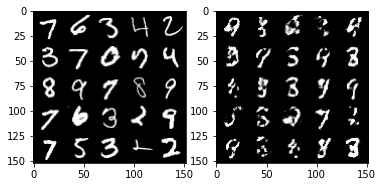

Epoch: 117, step: 55000, Gen Loss: 1.3488580462932582, Disc Loss: 0.4634327375292779


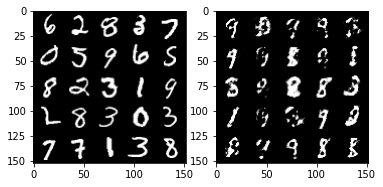

Epoch: 118, step: 55500, Gen Loss: 1.3333123161792761, Disc Loss: 0.468251814723015


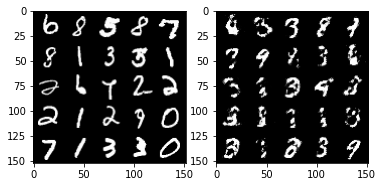

Epoch: 119, step: 56000, Gen Loss: 1.3309222705364219, Disc Loss: 0.4718312047719959


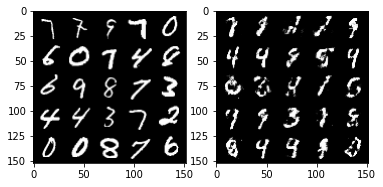

Epoch: 120, step: 56500, Gen Loss: 1.360125818490982, Disc Loss: 0.46738788527250313


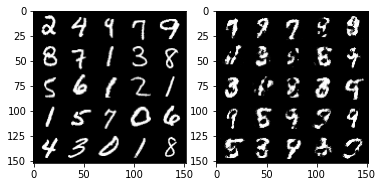

Epoch: 121, step: 57000, Gen Loss: 1.3199348638057706, Disc Loss: 0.4788262560367581


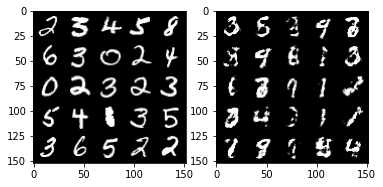

Epoch: 122, step: 57500, Gen Loss: 1.316701310634613, Disc Loss: 0.48866471123695376


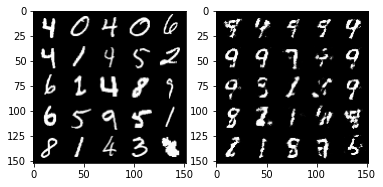

Epoch: 123, step: 58000, Gen Loss: 1.2725588973760609, Disc Loss: 0.4914755553603179


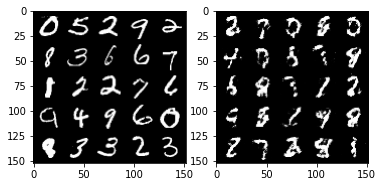

Epoch: 124, step: 58500, Gen Loss: 1.3468539764881133, Disc Loss: 0.46187184274196647


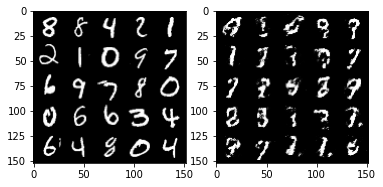

Epoch: 125, step: 59000, Gen Loss: 1.321181155681611, Disc Loss: 0.48563169586658494


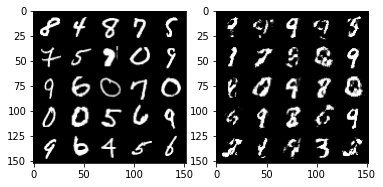

Epoch: 126, step: 59500, Gen Loss: 1.3307722084522255, Disc Loss: 0.4730333589315412


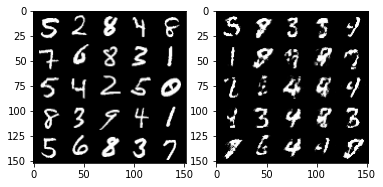

Epoch: 127, step: 60000, Gen Loss: 1.3616038825511938, Disc Loss: 0.4574867978096004


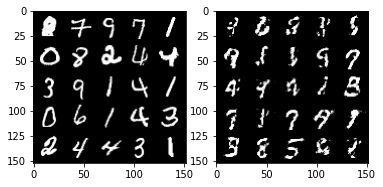

Epoch: 128, step: 60500, Gen Loss: 1.3097221968173989, Disc Loss: 0.4687467578053473


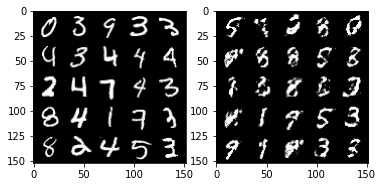

Epoch: 130, step: 61000, Gen Loss: 1.3041041638851176, Disc Loss: 0.48626455688476594


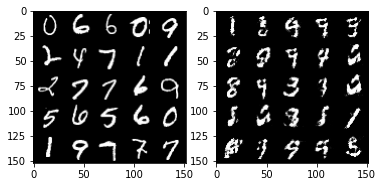

Epoch: 131, step: 61500, Gen Loss: 1.2389132649898529, Disc Loss: 0.5055774721503261


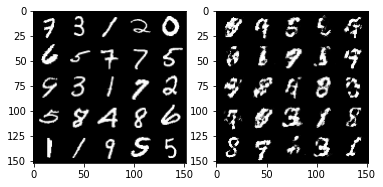

Epoch: 132, step: 62000, Gen Loss: 1.2221296663284298, Disc Loss: 0.5086020219326014


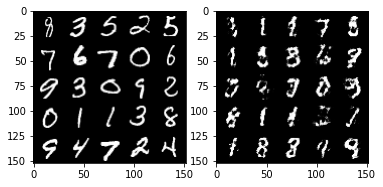

Epoch: 133, step: 62500, Gen Loss: 1.265806065559386, Disc Loss: 0.48186171889305135


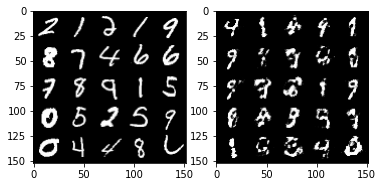

Epoch: 134, step: 63000, Gen Loss: 1.2801562900543217, Disc Loss: 0.47655066752433795


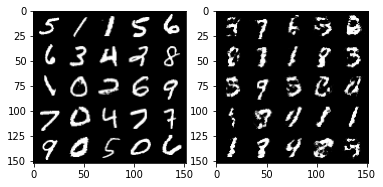

Epoch: 135, step: 63500, Gen Loss: 1.3053935928344726, Disc Loss: 0.46673897433280936


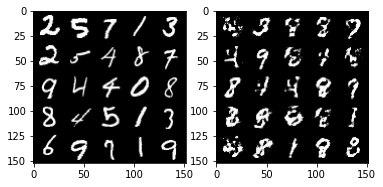

Epoch: 136, step: 64000, Gen Loss: 1.3114142825603483, Disc Loss: 0.4678541463613511


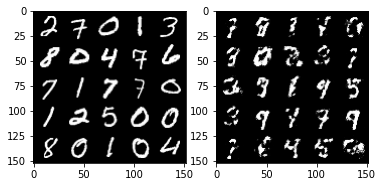

Epoch: 137, step: 64500, Gen Loss: 1.3164393043518061, Disc Loss: 0.4704323309659965


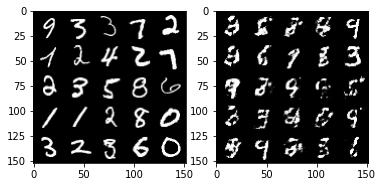

Epoch: 138, step: 65000, Gen Loss: 1.2787575159072864, Disc Loss: 0.47602668935060505


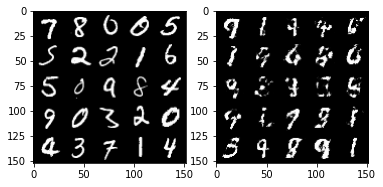

Epoch: 139, step: 65500, Gen Loss: 1.3044139819145188, Disc Loss: 0.4757231125235557


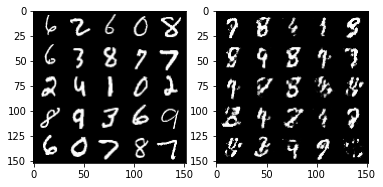

Epoch: 140, step: 66000, Gen Loss: 1.3258494920730592, Disc Loss: 0.46647721129655834


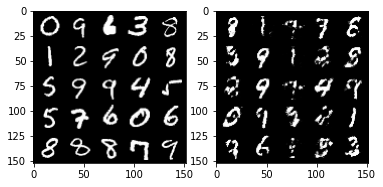

Epoch: 141, step: 66500, Gen Loss: 1.2957447314262398, Disc Loss: 0.49005981099605517


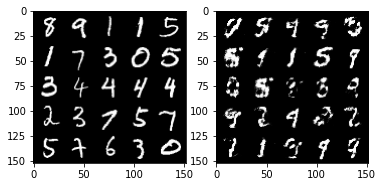

Epoch: 142, step: 67000, Gen Loss: 1.2571316983699807, Disc Loss: 0.490784972965717


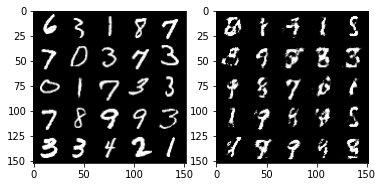

Epoch: 143, step: 67500, Gen Loss: 1.2741477758884434, Disc Loss: 0.48875172305107173


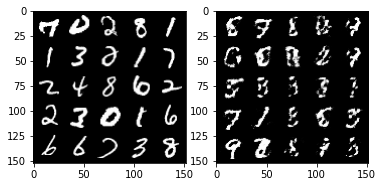

Epoch: 144, step: 68000, Gen Loss: 1.1856684387922278, Disc Loss: 0.5269214729070665


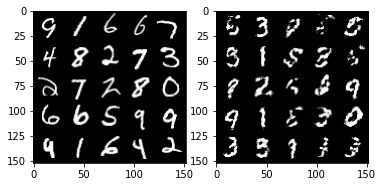

Epoch: 146, step: 68500, Gen Loss: 1.1439741275310524, Disc Loss: 0.5301988822817815


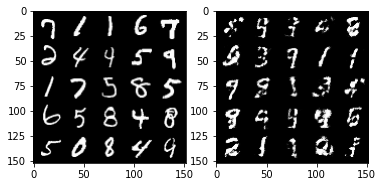

Epoch: 147, step: 69000, Gen Loss: 1.1614338734149927, Disc Loss: 0.5214198880791664


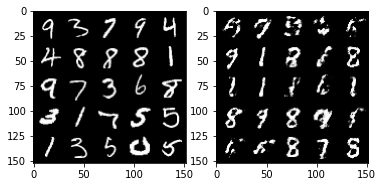

Epoch: 148, step: 69500, Gen Loss: 1.1717884542942054, Disc Loss: 0.5200398082137111


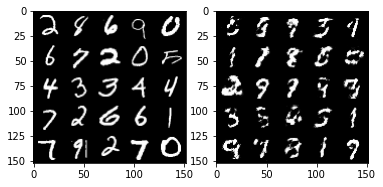

Epoch: 149, step: 70000, Gen Loss: 1.1330494338274009, Disc Loss: 0.5347252284288405


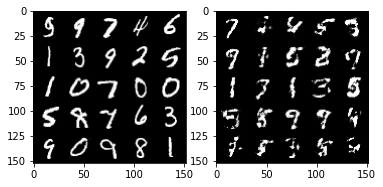

Epoch: 150, step: 70500, Gen Loss: 1.1685391912460328, Disc Loss: 0.5165460898280145


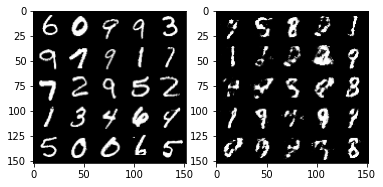

Epoch: 151, step: 71000, Gen Loss: 1.2023585110902784, Disc Loss: 0.5065961193442347


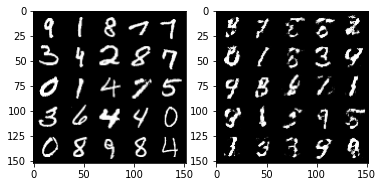

Epoch: 152, step: 71500, Gen Loss: 1.1627779172658914, Disc Loss: 0.5193086833953855


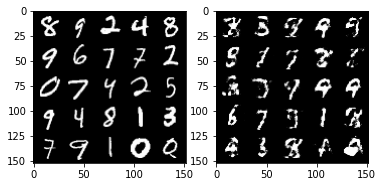

Epoch: 153, step: 72000, Gen Loss: 1.205098929882048, Disc Loss: 0.50368969976902


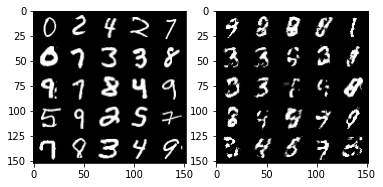

Epoch: 154, step: 72500, Gen Loss: 1.2463415181636817, Disc Loss: 0.48909869319200516


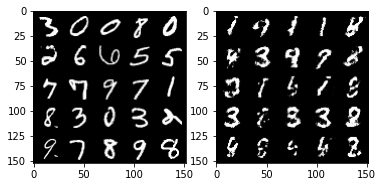

Epoch: 155, step: 73000, Gen Loss: 1.1503341635465614, Disc Loss: 0.517774504303932


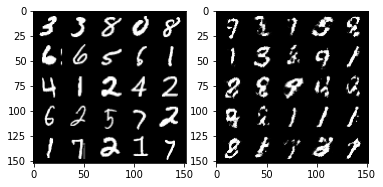

Epoch: 156, step: 73500, Gen Loss: 1.191045070409775, Disc Loss: 0.5032725793719287


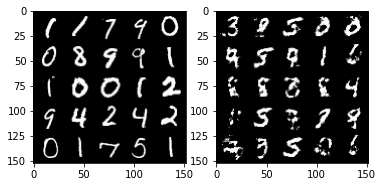

Epoch: 157, step: 74000, Gen Loss: 1.1491344410181055, Disc Loss: 0.5212315331697461


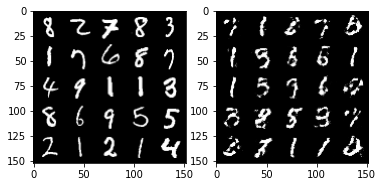

Epoch: 158, step: 74500, Gen Loss: 1.2045760488510135, Disc Loss: 0.5040522018074991


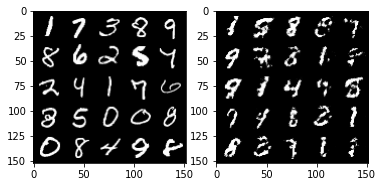

Epoch: 159, step: 75000, Gen Loss: 1.1891131401062018, Disc Loss: 0.5095836401581765


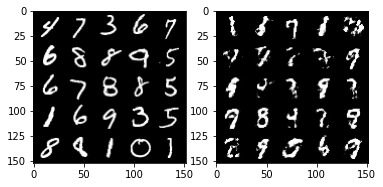

Epoch: 160, step: 75500, Gen Loss: 1.157150333404541, Disc Loss: 0.5177936336398131


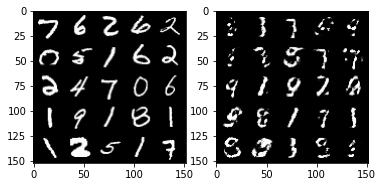

Epoch: 162, step: 76000, Gen Loss: 1.1695173293352137, Disc Loss: 0.5132656186819075


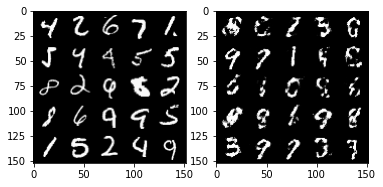

Epoch: 163, step: 76500, Gen Loss: 1.1632654981613169, Disc Loss: 0.5211933559775358


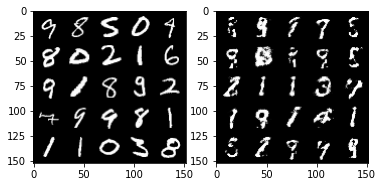

Epoch: 164, step: 77000, Gen Loss: 1.1945900664329527, Disc Loss: 0.5043222057223321


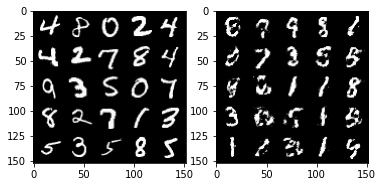

Epoch: 165, step: 77500, Gen Loss: 1.1136793701648702, Disc Loss: 0.5462219741940503


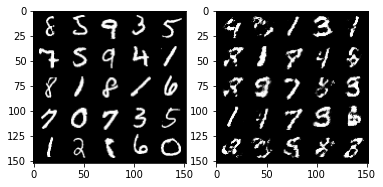

Epoch: 166, step: 78000, Gen Loss: 1.2019479092359533, Disc Loss: 0.49910742944479003


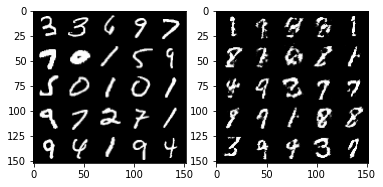

Epoch: 167, step: 78500, Gen Loss: 1.1539303627014155, Disc Loss: 0.5320045719742771


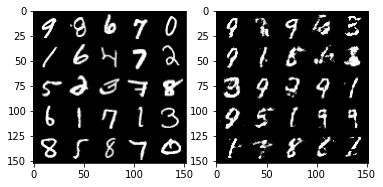

Epoch: 168, step: 79000, Gen Loss: 1.1900496033430104, Disc Loss: 0.5113815845251082


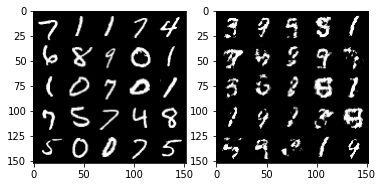

Epoch: 169, step: 79500, Gen Loss: 1.1431831645965573, Disc Loss: 0.512406085431576


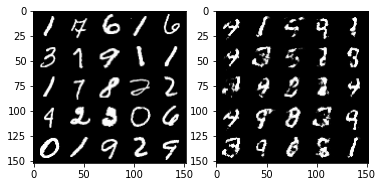

Epoch: 170, step: 80000, Gen Loss: 1.1735129842758176, Disc Loss: 0.514121159315109


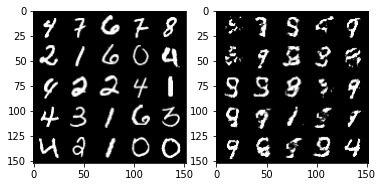

Epoch: 171, step: 80500, Gen Loss: 1.1292277109622946, Disc Loss: 0.52769569504261


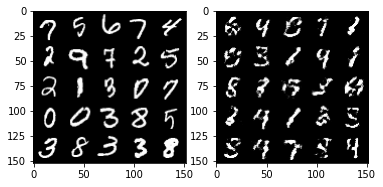

Epoch: 172, step: 81000, Gen Loss: 1.1577113921642295, Disc Loss: 0.530867638587951


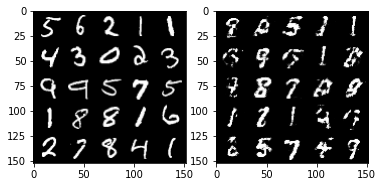

Epoch: 173, step: 81500, Gen Loss: 1.063387217879296, Disc Loss: 0.5579238092899323


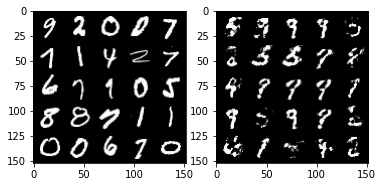

Epoch: 174, step: 82000, Gen Loss: 1.139268648743628, Disc Loss: 0.5221121302247049


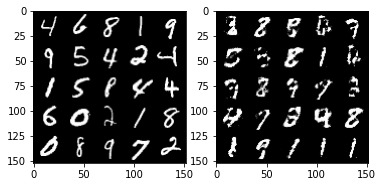

Epoch: 175, step: 82500, Gen Loss: 1.052160382390023, Disc Loss: 0.5582224867343906


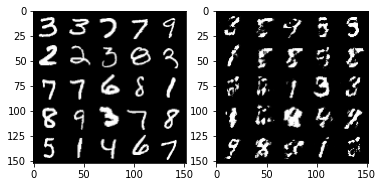

Epoch: 176, step: 83000, Gen Loss: 1.044664086580277, Disc Loss: 0.5528297412395473


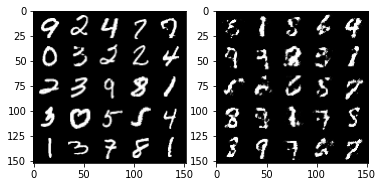

Epoch: 178, step: 83500, Gen Loss: 1.144781723618507, Disc Loss: 0.5139106512069701


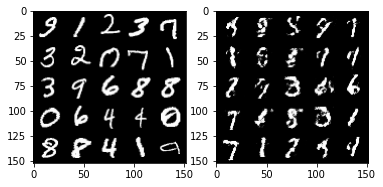

Epoch: 179, step: 84000, Gen Loss: 1.0460474497079848, Disc Loss: 0.5711177400350574


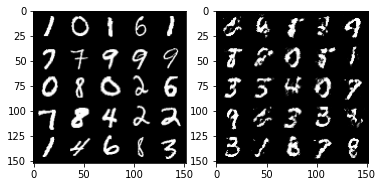

Epoch: 180, step: 84500, Gen Loss: 1.1114086098670959, Disc Loss: 0.5378288114666938


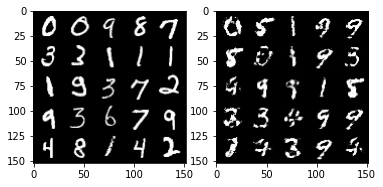

Epoch: 181, step: 85000, Gen Loss: 1.1112021579742437, Disc Loss: 0.5403017703294756


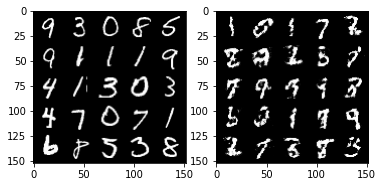

Epoch: 182, step: 85500, Gen Loss: 1.1661180658340453, Disc Loss: 0.523396741509438


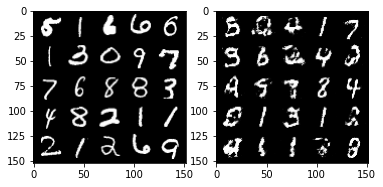

Epoch: 183, step: 86000, Gen Loss: 1.034160230517387, Disc Loss: 0.5526368498206133


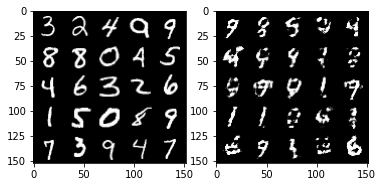

Epoch: 184, step: 86500, Gen Loss: 1.0835907864570622, Disc Loss: 0.5281222069263456


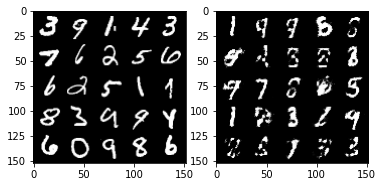

Epoch: 185, step: 87000, Gen Loss: 1.1002970243692394, Disc Loss: 0.5347610499262809


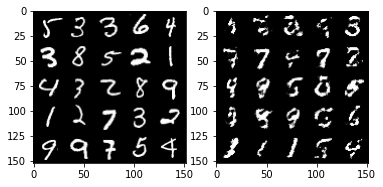

Epoch: 186, step: 87500, Gen Loss: 1.1297693594694136, Disc Loss: 0.5215790333151821


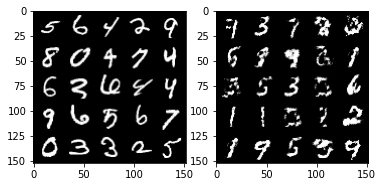

Epoch: 187, step: 88000, Gen Loss: 1.0363862054347988, Disc Loss: 0.5623649155497547


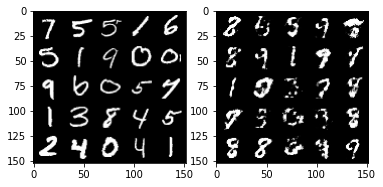

Epoch: 188, step: 88500, Gen Loss: 1.0768638514280326, Disc Loss: 0.5348373236060139


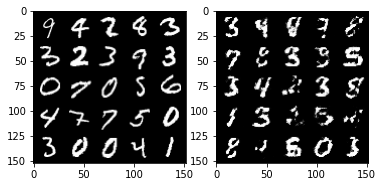

Epoch: 189, step: 89000, Gen Loss: 1.130553681850433, Disc Loss: 0.5191149559020996


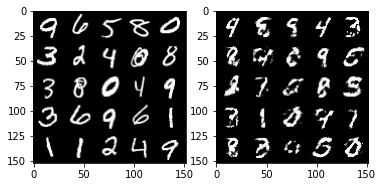

Epoch: 190, step: 89500, Gen Loss: 1.1355440161228176, Disc Loss: 0.5216713285446166


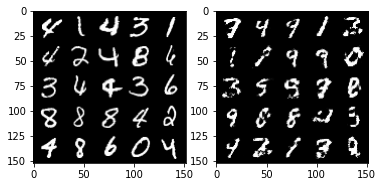

Epoch: 191, step: 90000, Gen Loss: 1.0704673371314999, Disc Loss: 0.5511886405944822


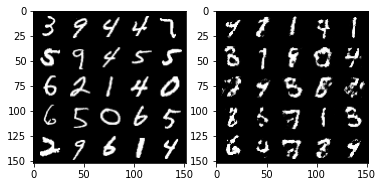

Epoch: 192, step: 90500, Gen Loss: 1.050874489307403, Disc Loss: 0.5544434611797326


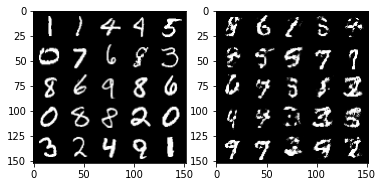

Epoch: 194, step: 91000, Gen Loss: 1.06490040254593, Disc Loss: 0.5480463184714316


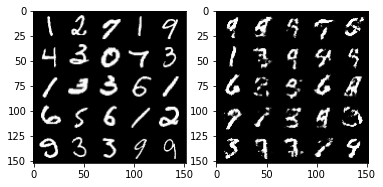

Epoch: 195, step: 91500, Gen Loss: 0.7807258184552187, Disc Loss: 0.9675886572003374


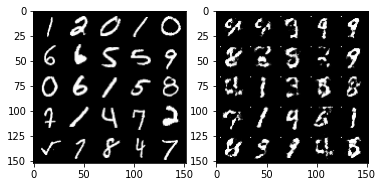

Epoch: 196, step: 92000, Gen Loss: 0.48627263182401664, Disc Loss: 1.0118175799846647


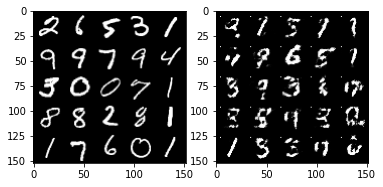

Epoch: 197, step: 92500, Gen Loss: 0.5858281356692311, Disc Loss: 0.8155746022462842


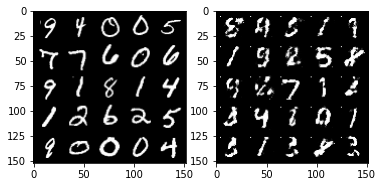

Epoch: 198, step: 93000, Gen Loss: 0.7308684821128847, Disc Loss: 0.6776489734649661


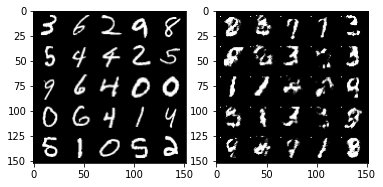

Epoch: 199, step: 93500, Gen Loss: 0.9206182764768599, Disc Loss: 0.5644509716033934


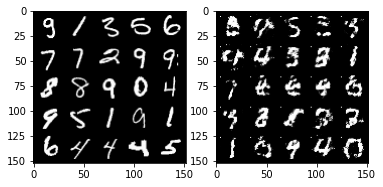

In [31]:
from tqdm.auto import tqdm

cur_step =0
mean_generator_loss=0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False 
error = False 

for epoch in range(n_epochs):
    for real, _ in tqdm(dataloader, leave=False):
        cur_batch_size = len(real)
        real=real.view(cur_batch_size, -1).to(device)

        # Training Discriminator
        disc_optimizer.zero_grad()
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        disc_loss.backward(retain_graph=True)
        disc_optimizer.step()

        # Traning Generator
        gen_optimizer.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_optimizer.step()

        # Keeping track of the averate discriminator and generator losses
        mean_discriminator_loss += disc_loss.item()/display_step
        mean_generator_loss += gen_loss.item()/display_step

        # Training Process Visualization
        if cur_step % display_step ==0 and cur_step >0:
            print(f'Epoch: {epoch}, step: {cur_step}, Gen Loss: {mean_generator_loss}, Disc Loss: {mean_discriminator_loss}')
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(real, fake)

            mean_generator_loss = 0
            mean_discriminator_loss = 0
        
        cur_step += 1

In [33]:
params = gen.parameters()

In [35]:
params

<generator object Module.parameters at 0x7f6076d8a990>